In [31]:
import pandas as pd
import numpy as np
from sklearn.metrics import precision_score, recall_score, accuracy_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image

In [4]:
df = pd.read_csv('../input/dr-inference/final_inference.csv')

In [5]:
df.head()

,path,real,0,1,2,3,4
0,../input/drunstratified/content/non_stratified...,0,37.06,38.11,21.89,2.94,0.00
1,../input/drunstratified/content/non_stratified...,0,43.60,27.91,22.77,5.72,0.00
2,../input/drunstratified/content/non_stratified...,0,46.30,29.55,22.92,1.23,0.00
3,../input/drunstratified/content/non_stratified...,0,50.46,26.26,20.61,2.67,0.00
4,../input/drunstratified/content/non_stratified...,0,42.10,30.81,16.89,0.00,10.19


In [6]:
df['predicted'] = df.iloc[:, 2:].idxmax(axis=1)

In [7]:
df['predicted'] = pd.to_numeric(df.predicted)

In [8]:
precision_score(df.real, df.predicted,  average='macro')

0.7646710891382111

In [9]:
recall_score(df.real, df.predicted,  average='macro')

0.6689623696269592

In [10]:
accuracy_score(df.real, df.predicted)

0.8729965182388458

In [11]:
confusion_matrix(df.real, df.predicted)

array([[48623,  1161,   519,     8,    26],
       [ 2661,  2094,   282,     5,     9],
       [ 2053,   525,  6918,   225,   102],
       [   53,    20,   539,   915,    34],
       [   79,     9,   199,   136,   874]])

<AxesSubplot:>

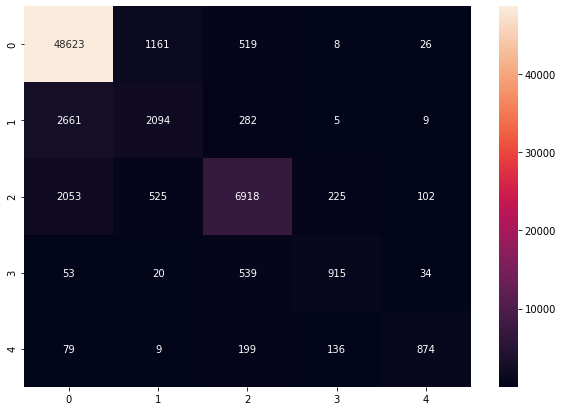

In [12]:
df_cm = pd.DataFrame(confusion_matrix(df.real, df.predicted), index = [i for i in "01234"],
                  columns = [i for i in "01234"])
plt.figure(figsize = (10,7))
sns.heatmap(df_cm, annot=True,  fmt='g')

### Problems:

1. More than 50% of Grade 1 is being predicted as Grade 0
2. A significant Grade 2 is being predicted as Grade 0
3. Check images from Grade 0 being predicted as Grade 4
4. Check images from Grade 4 being predicted as Grade 0
5. Check images from Grade 2, 3 being predicted as Grade 0

## 4 is being predicted as Grade 0. Why?

In [14]:
df_ = df[(df.real==4) & (df.predicted==0)]

In [15]:
df_

,path,real,0,1,2,3,4,predicted
66794,../input/drunstratified/content/non_stratified...,4,45.47,0.00,13.78,2.02,38.73,0
66846,../input/drunstratified/content/non_stratified...,4,65.46,0.00,5.24,5.34,23.97,0
66852,../input/drunstratified/content/non_stratified...,4,39.09,4.46,18.87,0.00,37.57,0
66860,../input/drunstratified/content/non_stratified...,4,40.13,0.00,20.10,3.40,36.37,0
66872,../input/drunstratified/content/non_stratified...,4,33.67,24.02,28.16,14.16,0.00,0
...,...,...,...,...,...,...,...,...
67982,../input/drunstratified/content/non_stratified...,4,38.21,20.64,30.85,0.00,10.30,0
67998,../input/drunstratified/content/non_stratified...,4,51.19,0.73,7.79,0.00,40.29,0
68018,../input/drunstratified/content/non_stratified...,4,41.57,20.90,14.10,0.00,23.43,0
68021,../input/drunstratified/content/non_stratified...,4,42.22,32.08,25.59,0.00,0.12,0


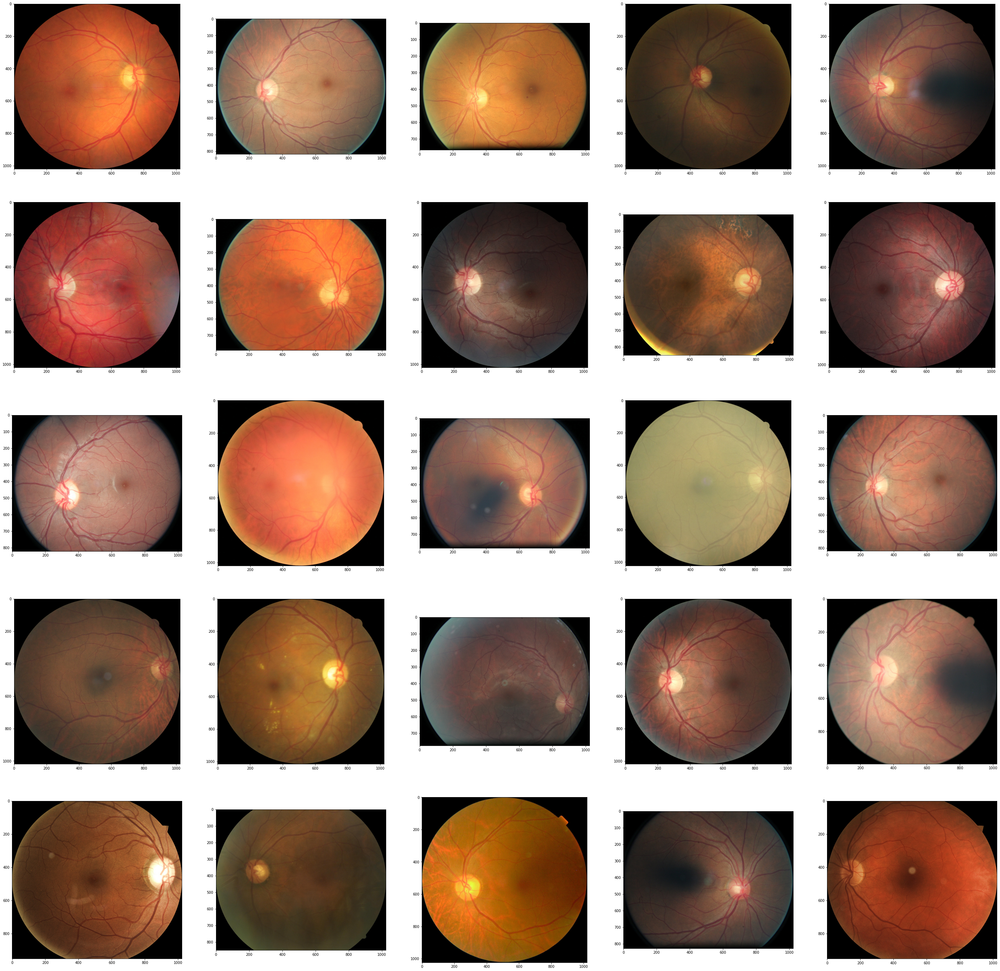

In [45]:
fig=plt.figure(figsize=(50, 50))
columns = 5
rows = 5
for i in range(1, columns*rows +1):
    img = np.array(Image.open(df.sample().path.iloc[0]))
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
plt.show()

### 0 is being predicted as Grade 4. Why?

In [38]:
df__ = df[(df.real==0) & (df.predicted==4)]

In [39]:
df__

,path,real,0,1,2,3,4,predicted
1422,../input/drunstratified/content/non_stratified...,0,32.65,12.29,20.80,0.00,34.26,4
8428,../input/drunstratified/content/non_stratified...,0,31.25,0.00,9.83,2.77,56.16,4
10228,../input/drunstratified/content/non_stratified...,0,31.32,13.51,12.00,0.00,43.18,4
14972,../input/drunstratified/content/non_stratified...,0,16.17,0.00,26.75,21.33,35.74,4
17789,../input/drunstratified/content/non_stratified...,0,28.45,0.00,14.56,1.47,55.52,4
18046,../input/drunstratified/content/non_stratified...,0,33.61,17.66,14.85,0.00,33.88,4
19357,../input/drunstratified/content/non_stratified...,0,33.78,0.00,16.33,10.99,38.90,4
23228,../input/drunstratified/content/non_stratified...,0,32.80,0.00,9.57,19.88,37.75,4
23800,../input/drunstratified/content/non_stratified...,0,23.41,25.71,9.31,0.00,41.57,4
25167,../input/drunstratified/content/non_stratified...,0,29.21,15.05,26.50,0.00,29.24,4


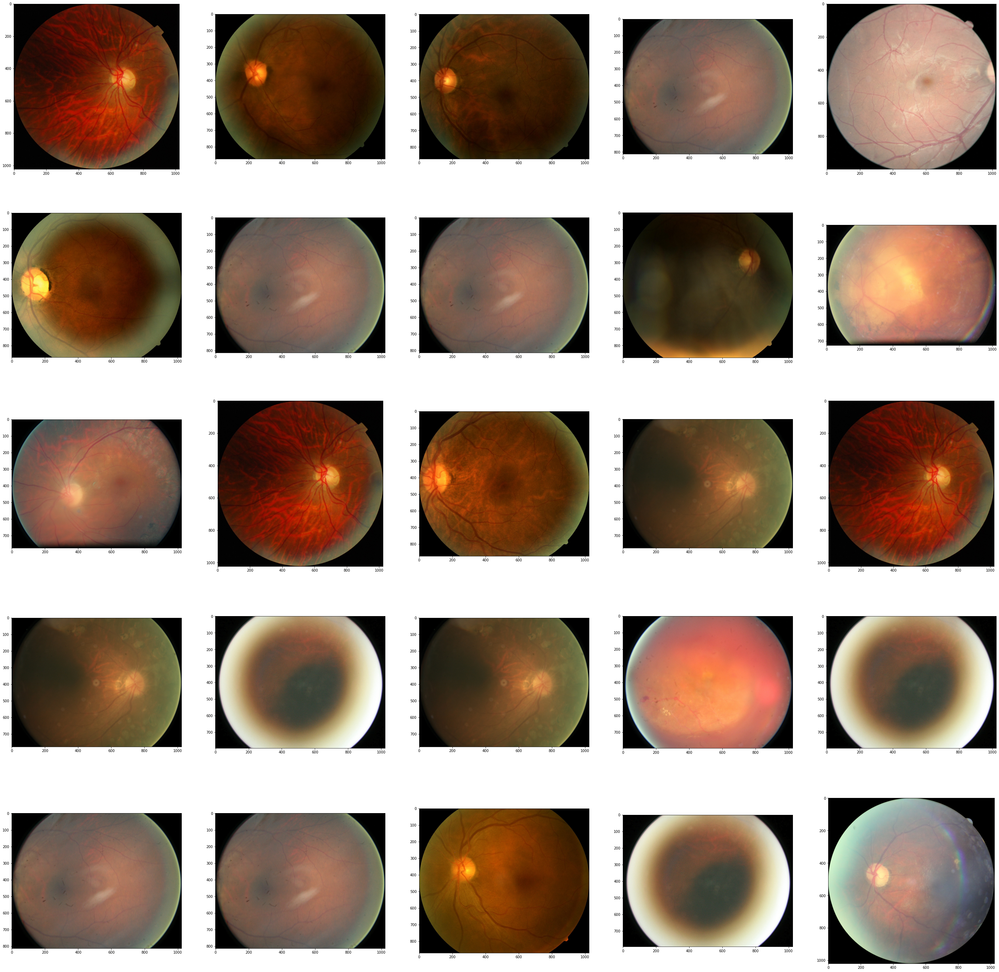

In [44]:
fig=plt.figure(figsize=(50, 50))
columns = 5
rows = 5
for i in range(1, columns*rows +1):
    img = np.array(Image.open(df__.sample().path.iloc[0]))
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
plt.show()

In [41]:
### These images are bad. Even an opthalmogist would have a difficult time identifying the difference.